<a href="https://colab.research.google.com/github/aaaven/aiarts2020/blob/master/week06_06_transfer_learning_keras_finetune_vgg/transfer_learning_keras_finetune_vgg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import keras
from keras.preprocessing.image import ImageDataGenerator, load_img

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [26]:
!wget --no-check-certificate -r 'https://docs.google.com/uc?export=download&id=16SR0v75URMnx_Eqq327rFEWCcj_VulpC' \
-O learnopencv-Keras-Fine-Tuning.zip

!unzip learnopencv-Keras-Fine-Tuning.zip

train_dir = 'clean-dataset/train'
validation_dir = 'clean-dataset/validation'
image_size = 224

will be placed in the single file you specified.

--2020-03-20 19:45:45--  https://docs.google.com/uc?export=download&id=16SR0v75URMnx_Eqq327rFEWCcj_VulpC
Resolving docs.google.com (docs.google.com)... 74.125.142.113, 74.125.142.101, 74.125.142.100, ...
Connecting to docs.google.com (docs.google.com)|74.125.142.113|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0g-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/916vmmo4c84mqves9k481i9n7889ck6j/1584733500000/09826901272346898790/*/16SR0v75URMnx_Eqq327rFEWCcj_VulpC?e=download [following]
--2020-03-20 19:45:47--  https://doc-0g-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/916vmmo4c84mqves9k481i9n7889ck6j/1584733500000/09826901272346898790/*/16SR0v75URMnx_Eqq327rFEWCcj_VulpC?e=download
Resolving doc-0g-8g-docs.googleusercontent.com (doc-0g-8g-docs.googleusercontent.com)... 74.125.195.132, 2607:f8b0:400e:c09::84
Connecting to

## Experiment 1: Freezing all layers - Same as Transfer Learning
Create the model

In [11]:
from keras.applications import VGG16

#Load the VGG model
vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

# Freeze all the layers
for layer in vgg_conv.layers[:]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)


from keras import models
from keras import layers
from keras import optimizers

# Create the model
model = models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(3, activation='softmax'))

# Show a summary of the model. Check the number of trainable parameters
model.summary()

<keras.engine.input_layer.InputLayer object at 0x7f4739994320> False
<keras.layers.convolutional.Conv2D object at 0x7f4739994940> False
<keras.layers.convolutional.Conv2D object at 0x7f4739994898> False
<keras.layers.pooling.MaxPooling2D object at 0x7f471ee48dd8> False
<keras.layers.convolutional.Conv2D object at 0x7f471e17ec88> False
<keras.layers.convolutional.Conv2D object at 0x7f471e185780> False
<keras.layers.pooling.MaxPooling2D object at 0x7f471e19a4e0> False
<keras.layers.convolutional.Conv2D object at 0x7f471e17fc50> False
<keras.layers.convolutional.Conv2D object at 0x7f471e17dd30> False
<keras.layers.convolutional.Conv2D object at 0x7f471e181c18> False
<keras.layers.pooling.MaxPooling2D object at 0x7f471ea33710> False
<keras.layers.convolutional.Conv2D object at 0x7f471ea23b00> False
<keras.layers.convolutional.Conv2D object at 0x7f471ea29c18> False
<keras.layers.convolutional.Conv2D object at 0x7f471ea187b8> False
<keras.layers.pooling.MaxPooling2D object at 0x7f471ea394a8>

## Experiment 1
Train the model

Found 600 images belonging to 3 classes.
Found 150 images belonging to 3 classes.
Epoch 1/20
6/6 [==============================] - 3s 469ms/step - loss: 5.7707 - acc: 0.3667 - val_loss: 1.8702 - val_acc: 0.3400
Epoch 2/20
6/6 [==============================] - 2s 329ms/step - loss: 1.2009 - acc: 0.5600 - val_loss: 0.8296 - val_acc: 0.5733
Epoch 3/20
6/6 [==============================] - 2s 330ms/step - loss: 0.4506 - acc: 0.8233 - val_loss: 0.4713 - val_acc: 0.8133
Epoch 4/20
6/6 [==============================] - 2s 329ms/step - loss: 0.4135 - acc: 0.8467 - val_loss: 0.5425 - val_acc: 0.7933
Epoch 5/20
6/6 [==============================] - 2s 328ms/step - loss: 0.4741 - acc: 0.8050 - val_loss: 0.6330 - val_acc: 0.7667
Epoch 6/20
6/6 [==============================] - 2s 330ms/step - loss: 0.1814 - acc: 0.9367 - val_loss: 0.3323 - val_acc: 0.8733
Epoch 7/20
6/6 [==============================] - 2s 330ms/step - loss: 0.1082 - acc: 0.9750 - val_loss: 0.4123 - val_acc: 0.8400
Epoch 8/

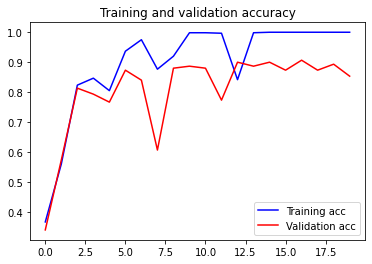

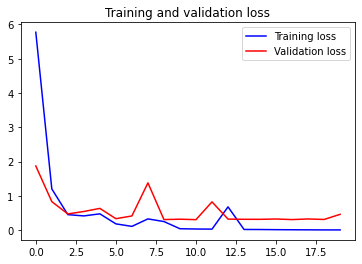

In [12]:
# No Data augmentation 
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 100
val_batchsize = 10

# Data Generator for Training data
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data Generator for Validation data
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the Model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=20,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

# Save the Model
model.save('all_freezed.h5')

# Plot the accuracy and loss curves
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

## Experiment 1
Show the errors

Found 150 images belonging to 3 classes.
15/15 [==============================] - 1s 43ms/step
No of errors = 22/150


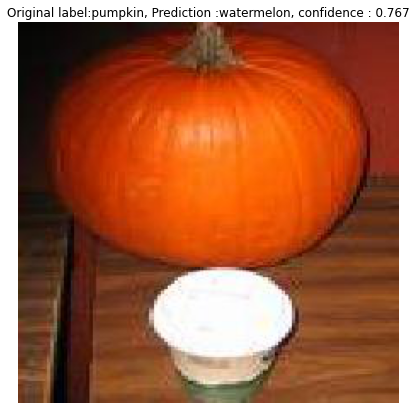

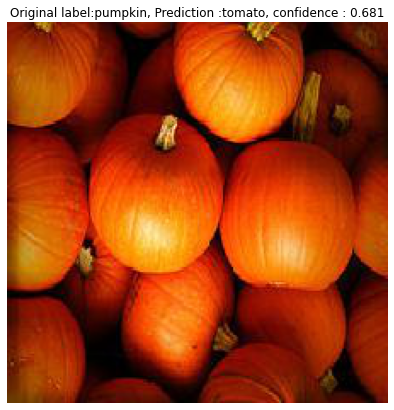

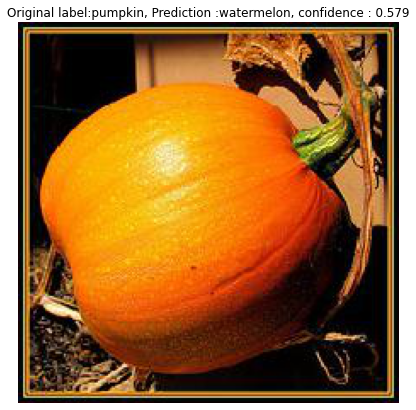

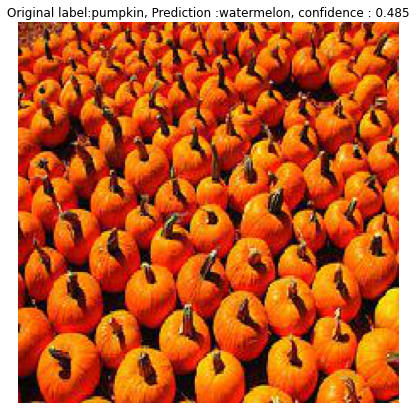

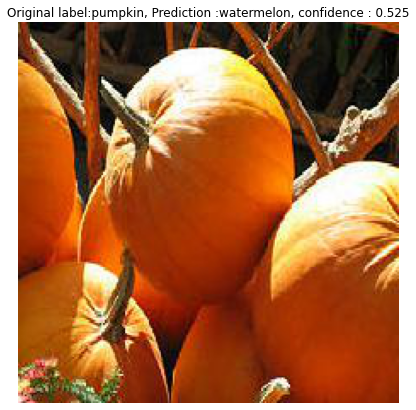

...

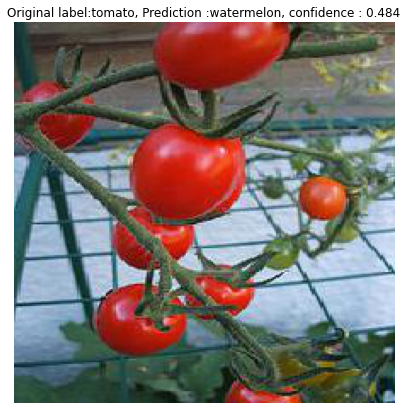

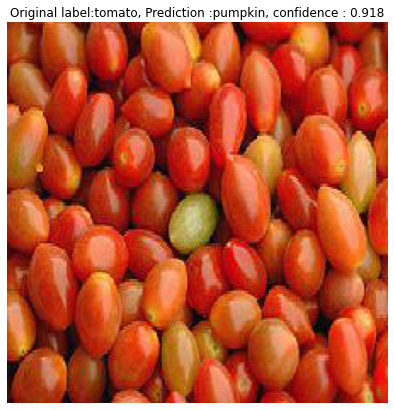

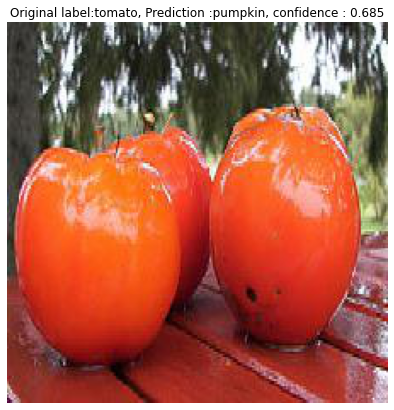

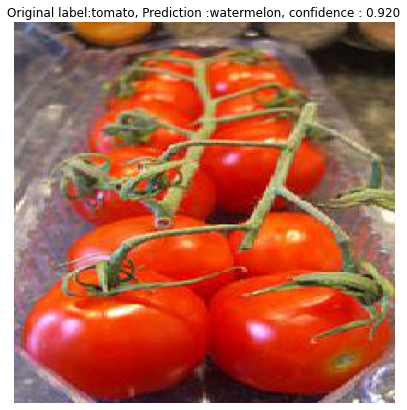

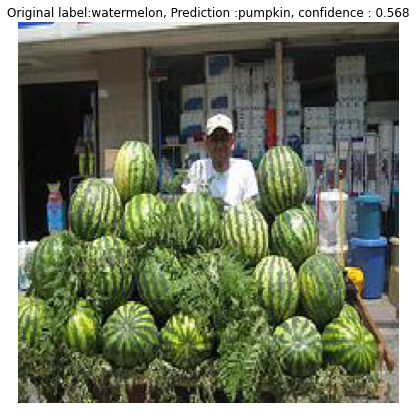

In [17]:
# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Get the filenames from the generator
fnames = validation_generator.filenames

# Get the ground truth from generator
ground_truth = validation_generator.classes

# Get the label to class mapping from the generator
label2index = validation_generator.class_indices

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)

errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))

# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
    
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
    
    original = load_img('{}/{}'.format(validation_dir,fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()

## Experiment 2 : Train Last 4 layers without data augmentation

In [18]:
from keras.applications import VGG16

#Load the VGG model
vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

# Freeze all the layers
for layer in vgg_conv.layers[:-4]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)


from keras import models
from keras import layers
from keras import optimizers

# Create the model
model = models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(3, activation='softmax'))

# Show a summary of the model. Check the number of trainable parameters
model.summary()

<keras.engine.input_layer.InputLayer object at 0x7f471df7e2b0> False
<keras.layers.convolutional.Conv2D object at 0x7f471df7e278> False
<keras.layers.convolutional.Conv2D object at 0x7f471df7e320> False
<keras.layers.pooling.MaxPooling2D object at 0x7f471e8031d0> False
<keras.layers.convolutional.Conv2D object at 0x7f471e88c0b8> False
<keras.layers.convolutional.Conv2D object at 0x7f471ee3bbe0> False
<keras.layers.pooling.MaxPooling2D object at 0x7f471e82e400> False
<keras.layers.convolutional.Conv2D object at 0x7f471ef34668> False
<keras.layers.convolutional.Conv2D object at 0x7f471ee05240> False
<keras.layers.convolutional.Conv2D object at 0x7f471ea6b438> False
<keras.layers.pooling.MaxPooling2D object at 0x7f471eb72320> False
<keras.layers.convolutional.Conv2D object at 0x7f471eb70cc0> False
<keras.layers.convolutional.Conv2D object at 0x7f471eaeae10> False
<keras.layers.convolutional.Conv2D object at 0x7f471ed600f0> False
<keras.layers.pooling.MaxPooling2D object at 0x7f471dfbdb00>

## Experiment 2
Train the model

Found 600 images belonging to 3 classes.
Found 150 images belonging to 3 classes.
Epoch 1/20
6/6 [==============================] - 3s 559ms/step - loss: 2.5131 - acc: 0.3650 - val_loss: 0.7776 - val_acc: 0.6533
Epoch 2/20
6/6 [==============================] - 2s 357ms/step - loss: 0.8400 - acc: 0.6367 - val_loss: 0.4667 - val_acc: 0.8333
Epoch 3/20
6/6 [==============================] - 2s 358ms/step - loss: 0.6937 - acc: 0.7133 - val_loss: 0.3933 - val_acc: 0.8733
Epoch 4/20
6/6 [==============================] - 2s 358ms/step - loss: 0.2101 - acc: 0.9400 - val_loss: 1.1822 - val_acc: 0.7200
Epoch 5/20
6/6 [==============================] - 2s 358ms/step - loss: 0.2127 - acc: 0.9183 - val_loss: 0.2074 - val_acc: 0.9467
Epoch 6/20
6/6 [==============================] - 2s 358ms/step - loss: 0.0608 - acc: 0.9817 - val_loss: 0.6143 - val_acc: 0.7800
Epoch 7/20
6/6 [==============================] - 2s 358ms/step - loss: 0.3825 - acc: 0.8733 - val_loss: 0.2175 - val_acc: 0.9267
Epoch 8/

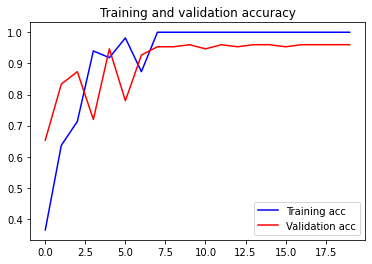

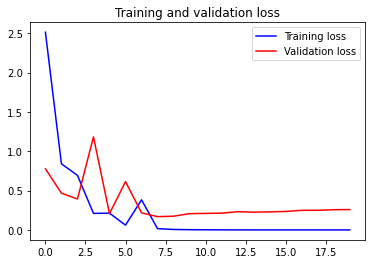

In [19]:
# No Data augmentation 
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 100
val_batchsize = 10

# Data Generator for Training data
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data Generator for Validation data
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the Model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=20,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

# Save the Model
model.save('last4_layers.h5')

# Plot the accuracy and loss curves
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

## Experiment 2
Show the errors

Found 150 images belonging to 3 classes.
15/15 [==============================] - 1s 45ms/step
No of errors = 6/150


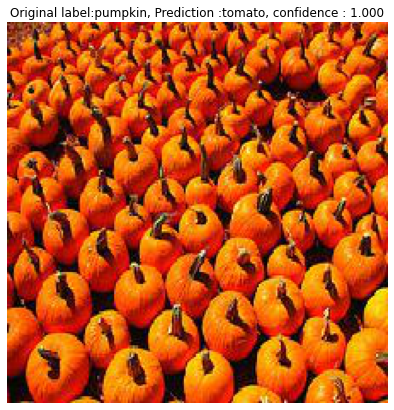

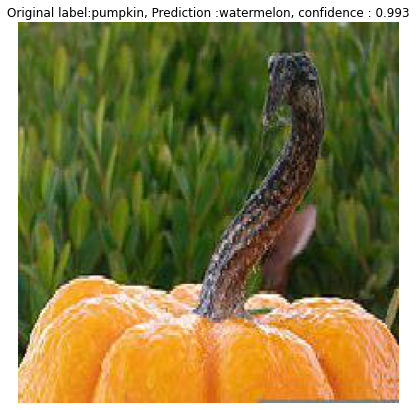

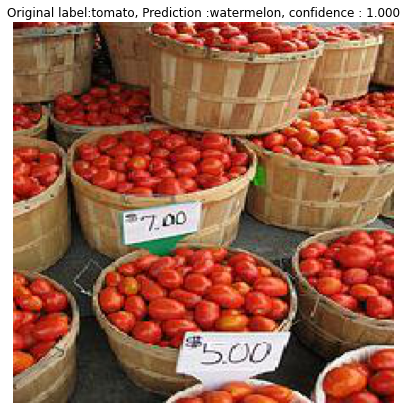

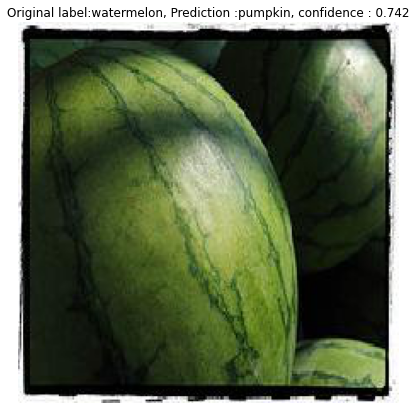

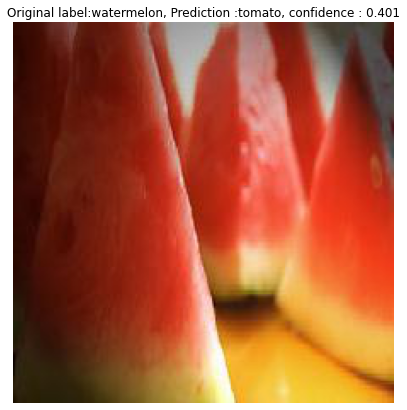

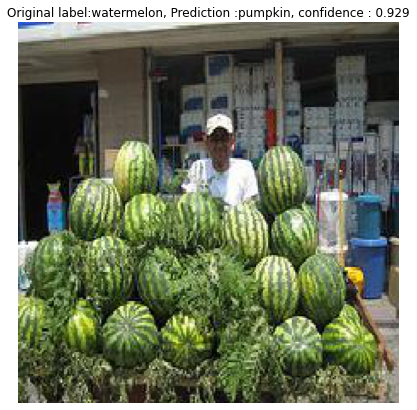

In [20]:
# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Get the filenames from the generator
fnames = validation_generator.filenames

# Get the ground truth from generator
ground_truth = validation_generator.classes

# Get the label to class mapping from the generator
label2index = validation_generator.class_indices

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)

errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))

# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
    
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
    
    original = load_img('{}/{}'.format(validation_dir,fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()

## Experiment 3 : Train last 4 layers with data augmentation


In [21]:
from keras.applications import VGG16

#Load the VGG model
vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

# Freeze all the layers
for layer in vgg_conv.layers[:-4]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)


from keras import models
from keras import layers
from keras import optimizers

# Create the model
model = models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(3, activation='softmax'))

# Show a summary of the model. Check the number of trainable parameters
model.summary()

<keras.engine.input_layer.InputLayer object at 0x7f471e8c47f0> False
<keras.layers.convolutional.Conv2D object at 0x7f471e8c4080> False
<keras.layers.convolutional.Conv2D object at 0x7f471e8c40b8> False
<keras.layers.pooling.MaxPooling2D object at 0x7f471efca9b0> False
<keras.layers.convolutional.Conv2D object at 0x7f471ebdb9b0> False
<keras.layers.convolutional.Conv2D object at 0x7f471e87f278> False
<keras.layers.pooling.MaxPooling2D object at 0x7f471e89b5c0> False
<keras.layers.convolutional.Conv2D object at 0x7f471e890c88> False
<keras.layers.convolutional.Conv2D object at 0x7f471e89c780> False
<keras.layers.convolutional.Conv2D object at 0x7f471e8844e0> False
<keras.layers.pooling.MaxPooling2D object at 0x7f471e8bb518> False
<keras.layers.convolutional.Conv2D object at 0x7f471e2b1e48> False
<keras.layers.convolutional.Conv2D object at 0x7f471e2c66a0> False
<keras.layers.convolutional.Conv2D object at 0x7f471e2d8400> False
<keras.layers.pooling.MaxPooling2D object at 0x7f471e2e8e48>

## Experiment 3
Train the model. Here we will be using the imageDataGenerator for data augmentation.

Found 600 images belonging to 3 classes.
Found 150 images belonging to 3 classes.
Epoch 1/40
24/24 [==============================] - 15s 620ms/step - loss: 1.5992 - acc: 0.4217 - val_loss: 0.7032 - val_acc: 0.7400
Epoch 2/40
24/24 [==============================] - 14s 588ms/step - loss: 0.7027 - acc: 0.6908 - val_loss: 0.4452 - val_acc: 0.8000
Epoch 3/40
24/24 [==============================] - 14s 585ms/step - loss: 0.3288 - acc: 0.8858 - val_loss: 0.2264 - val_acc: 0.9067
Epoch 4/40
24/24 [==============================] - 14s 591ms/step - loss: 0.1988 - acc: 0.9317 - val_loss: 0.2268 - val_acc: 0.9200
Epoch 5/40
24/24 [==============================] - 14s 603ms/step - loss: 0.1168 - acc: 0.9600 - val_loss: 0.1498 - val_acc: 0.9867
Epoch 6/40
24/24 [==============================] - 14s 588ms/step - loss: 0.1054 - acc: 0.9633 - val_loss: 0.1584 - val_acc: 0.9800
Epoch 7/40
24/24 [==============================] - 14s 586ms/step - loss: 0.0976 - acc: 0.9767 - val_loss: 0.1701 - val

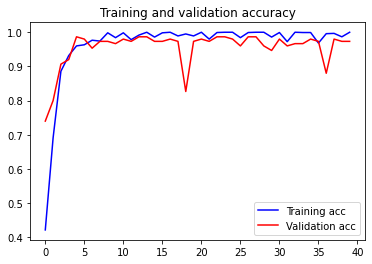

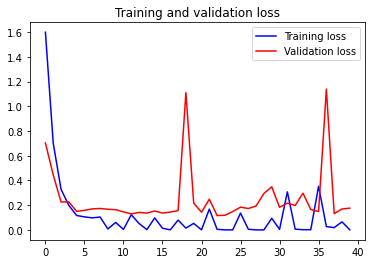

In [22]:
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=20,
      width_shift_range=0.2,
      height_shift_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 50
val_batchsize = 10

# Data Generator for Training data
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data Generator for Validation data
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the Model
# NOTE that we have multiplied the steps_per_epoch by 2. This is because we are using data augmentation.
history = model.fit_generator(
      train_generator,
      steps_per_epoch=2*train_generator.samples/train_generator.batch_size ,
      epochs=40,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

# Save the Model
model.save('da_last4_layers.h5')

# Plot the accuracy and loss curves
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

## Experiment 3
Show the errors

Found 150 images belonging to 3 classes.
15/15 [==============================] - 1s 47ms/step
No of errors = 4/150


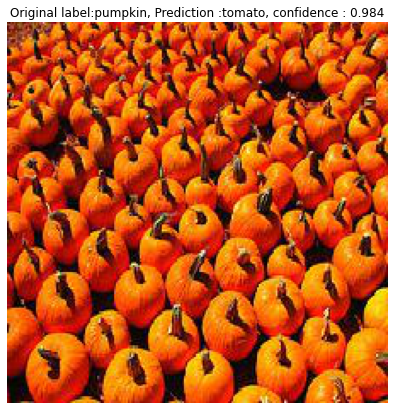

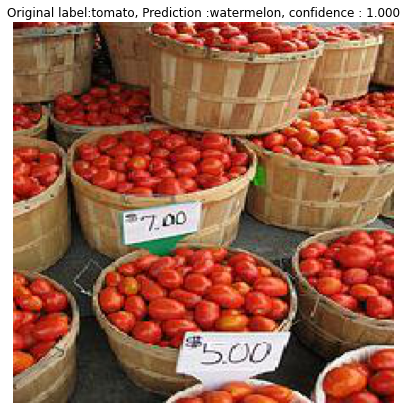

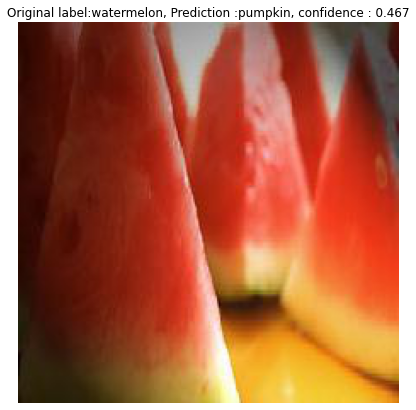

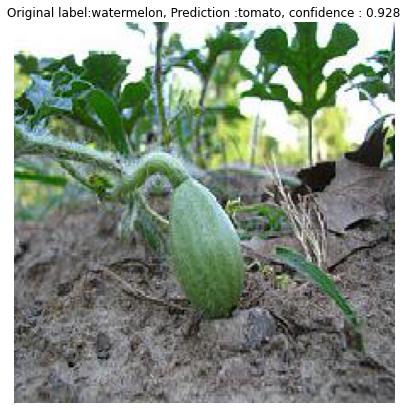

In [23]:
# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Get the filenames from the generator
fnames = validation_generator.filenames

# Get the ground truth from generator
ground_truth = validation_generator.classes

# Get the label to class mapping from the generator
label2index = validation_generator.class_indices

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)

errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))

# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
    
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
    
    original = load_img('{}/{}'.format(validation_dir,fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()